# Deep Learning - Assignment 2
GroupA_1: François, Hanne; Ibragimova, Regina; Wieme, Xander

In [ ]:
# Update keras to version 3
!pip install --upgrade keras wandb --quiet

# Update gdown
!pip install gdown --upgrade --quiet

!pip install keras-tuner --upgrade --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.5/263.5 kB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.0.5 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 3.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import wandb
import os
from os.path import basename, isdir

import numpy as np
import gdown
import shutil

import keras_tuner
import tensorflow
import keras
from keras import Sequential, datasets, initializers, regularizers
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam, SGD, AdamW
from keras.layers import (
    Flatten, BatchNormalization, Conv2D, Dense, Dropout, GlobalAveragePooling2D,
    Input, MaxPooling2D, GlobalMaxPooling2D, AveragePooling2D, Conv2DTranspose
)
from keras.models import Model, Sequential
from keras.utils import load_img, img_to_array, to_categorical
import keras.applications.resnet50 as resnet50
import keras.applications.vgg16 as vgg16
from keras_tuner.engine.hyperparameters import HyperParameters

from plotly.subplots import make_subplots
import plotly.graph_objects as go

from glob import iglob
from matplotlib import pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, top_k_accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
from sklearn.preprocessing import minmax_scale, normalize
from sklearn.manifold import TSNE
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

# Data loading, exploration and splitting
We have a food dataset which consists of 5 folders named bbq, dessert, pasta, salad and sushi.
As it can be seen from the barplot below, the data is well distributed and each folder contains about  280-300 images. In terms of size, the majority of images have a width of 1000 pixels, as indicated by the distribution of image sizes on the right. Although the heights are more diverse, they generally cluster between 400 and 800 pixels, so the standardisation is needed.

We printed the example of each category of food and found that the images are colorful and of high quality.

In [ ]:
!gdown 18j4OvAlNWX9pfaoiJNgcTEVslksaf4Dw

Downloading...
From (original): https://drive.google.com/uc?id=18j4OvAlNWX9pfaoiJNgcTEVslksaf4Dw
From (redirected): https://drive.google.com/uc?id=18j4OvAlNWX9pfaoiJNgcTEVslksaf4Dw&confirm=t&uuid=fdbb1464-0662-42ea-ae24-52b00237c474
To: /content/images.zip
100% 239M/239M [00:02<00:00, 101MB/s]


In [ ]:
!unzip /content/images.zip > /dev/null 2>&1

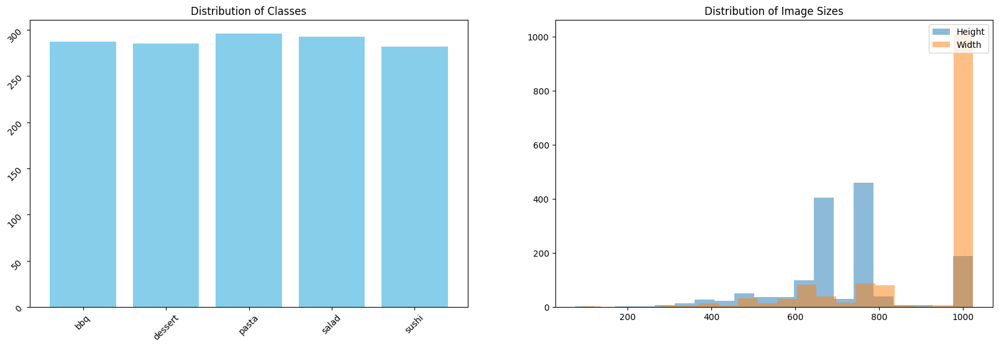

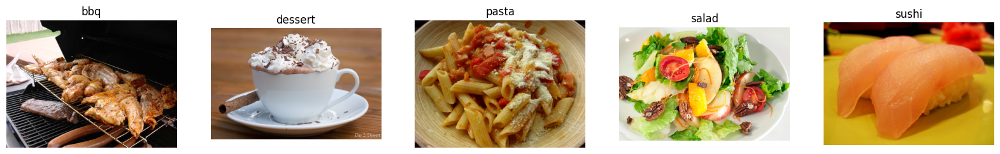

In [ ]:
# Directory containing the dataset
dataset_dir = '/content/images'

# Predefined categories
categories = ['bbq', 'dessert', 'pasta', 'salad', 'sushi']

# Create a figure with two subplots (side by side)
fig, axs = plt.subplots(1, 2, figsize=(20, 6))

# Plotting the distribution of classes on the first subplot
class_counts = {category: len(os.listdir(os.path.join(dataset_dir, category)))
               for category in categories}
axs[0].bar(class_counts.keys(), class_counts.values(), color='skyblue')
axs[0].set_title('Distribution of Classes')
axs[0].tick_params(labelrotation=45)

# Plotting the distribution of image sizes on the second subplot
heights = []
widths = []

for category in categories:
    category_path = os.path.join(dataset_dir, category)
    for image_name in os.listdir(category_path):
        img_path = os.path.join(category_path, image_name)
        img = plt.imread(img_path)
        heights.append(img.shape[0])
        widths.append(img.shape[1])

axs[1].hist(heights, bins=20, alpha=0.5, label='Height')
axs[1].hist(widths, bins=20, alpha=0.5, label='Width')
axs[1].legend(loc='upper right')
axs[1].set_title('Distribution of Image Sizes')

plt.show()

# Displaying sample images from each category in separate subplots
fig, axs = plt.subplots(1, len(categories), figsize=(20, 4))

for i, category in enumerate(categories):
    category_path = os.path.join(dataset_dir, category)
    images = os.listdir(category_path)
    if images:
        image_path = os.path.join(category_path, images[0])
        img = plt.imread(image_path)  # Load the image

        axs[i].imshow(img)
        axs[i].set_title(category)
        axs[i].axis('off')

plt.show()


We split the images to the train, validation and test datasets with ratio 0.7:0.15:0.15, maintaing the distribution across the subsets. After the splitting,  we got 1008 train, 216 validation, and 219 test samples.

In [ ]:
split_dir = "/content/images/split"

train_ratio = 0.70
validation_ratio = 0.15
test_ratio = 0.15

for category in categories:
    os.makedirs(os.path.join(split_dir, 'train', category), exist_ok=True)
    os.makedirs(os.path.join(split_dir, 'validation', category), exist_ok=True)
    os.makedirs(os.path.join(split_dir, 'test', category), exist_ok=True)

for category in categories:
    category_path = os.path.join(dataset_dir, category)
    images = [f for f in os.listdir(category_path) if
              os.path.isfile(os.path.join(category_path, f))]

    train, temp = train_test_split(images, test_size=(1.0 - train_ratio),
                                   random_state=42)
    validation, test = train_test_split(temp, test_size=test_ratio/
                        (test_ratio + validation_ratio), random_state=42)

    # Copy the files to the respective directories in the 'split' directory
    for image in train:
        shutil.copy(os.path.join(category_path, image),
                    os.path.join(split_dir, 'train', category, image))
    for image in validation:
        shutil.copy(os.path.join(category_path, image),
                    os.path.join(split_dir, 'validation', category, image))
    for image in test:
        shutil.copy(os.path.join(category_path, image),
                    os.path.join(split_dir, 'test', category, image))


In [ ]:
main_directories = ['train', 'validation', 'test']
total_counts = {main_dir: 0 for main_dir in main_directories}

for main_dir in main_directories:
    main_dir_path = os.path.join(split_dir, main_dir)
    for root, dirs, files in os.walk(main_dir_path):
        jpg_count = len([file for file in files if file.endswith('.jpg')])
        total_counts[main_dir] += jpg_count

for main_dir, count in total_counts.items():
    print(f"Total number of .jpg files in '/content/images/split/{main_dir}': {count}")

print("\nDetailed counts per category:")
for root, dirs, files in os.walk(split_dir):
    jpg_count = len([file for file in files if file.endswith('.jpg')])
    if jpg_count > 0:
        print(f"Number of .jpg files in '{root}': {jpg_count}")

Total number of .jpg files in '/content/images/split/train': 1008
Total number of .jpg files in '/content/images/split/validation': 216
Total number of .jpg files in '/content/images/split/test': 219

Detailed counts per category:
Number of .jpg files in '/content/images/split/validation/pasta': 44
Number of .jpg files in '/content/images/split/validation/salad': 44
Number of .jpg files in '/content/images/split/validation/sushi': 42
Number of .jpg files in '/content/images/split/validation/dessert': 43
Number of .jpg files in '/content/images/split/validation/bbq': 43
Number of .jpg files in '/content/images/split/test/pasta': 45
Number of .jpg files in '/content/images/split/test/salad': 44
Number of .jpg files in '/content/images/split/test/sushi': 43
Number of .jpg files in '/content/images/split/test/dessert': 43
Number of .jpg files in '/content/images/split/test/bbq': 44
Number of .jpg files in '/content/images/split/train/pasta': 207
Number of .jpg files in '/content/images/spl

# Data preprocessing
Next, we need to preprocess our images. We set the input shape to (224, 224, 3), so we preprocessed our data accordingly.

In [ ]:
def preprocess_images(
    path, classes=None, preprocessor=None, ext=".jpg", samples=None, **load_img_kwargs
):
    if classes is None:
        classes = ["."]
    X, y = [], []
    for classidx, classname in enumerate(classes):
        files = list(iglob(f"{path}/{classname}/*{ext}"))
        for img_idx, img_path in enumerate(files):
            print(f"{path}/{classname}: {img_idx} / {len(files)}", end="\r")
            if samples is not None and img_idx >= samples:
                break
            img = load_img(img_path, **load_img_kwargs)
            x = img_to_array(img)
            if preprocessor:
                x = preprocessor(x)
            X.append(x)
            y.append(classidx)
        print()
    return np.array(X), np.array(y)

In [ ]:
# we only extract sample data to save ram space
x_train, y_train = preprocess_images(os.path.join(split_dir, "train"),
                                     classes=categories,
                                     samples = 100,
                                     target_size=(224, 224))
x_valid, y_valid = preprocess_images(os.path.join(split_dir, "validation"),
                                     classes=categories,
                                     samples = 100,
                                     target_size=(224, 224))
x_test, y_test = preprocess_images(os.path.join(split_dir, "test"),
                                   classes=categories,
                                   samples = 100,
                                   target_size=(224, 224))

/content/images/split/train/bbq: 100 / 200
/content/images/split/train/dessert: 100 / 199
/content/images/split/train/pasta: 100 / 207
/content/images/split/train/salad: 100 / 205
/content/images/split/train/sushi: 100 / 197
/content/images/split/validation/bbq: 42 / 43
/content/images/split/validation/dessert: 42 / 43
/content/images/split/validation/pasta: 43 / 44
/content/images/split/validation/salad: 43 / 44
/content/images/split/validation/sushi: 41 / 42
/content/images/split/test/bbq: 43 / 44
/content/images/split/test/dessert: 42 / 43
/content/images/split/test/pasta: 44 / 45
/content/images/split/test/salad: 43 / 44
/content/images/split/test/sushi: 42 / 43


Next, we normalized the data.

In [ ]:
x_train /= 255
x_valid /= 255
x_test /= 255

Additionally, we encoded the outputs because we will be creating 5 output neurons (multi-class), each of which will provide an output that falls between 0 and 1.

In [ ]:
y_train_cat = to_categorical(y_train)
y_valid_cat = to_categorical(y_valid)
y_test_cat = to_categorical(y_test)

# Hyperparameter tuning
In order to tune hyperparamaters, hyperband and Bayesian search were conducted.

## Hyperband search

For this we tried the following options:

- learning rate: from 1e-4 to 1e-2
- optimizer: Adam, AdamW
- activation function: ReLU, GeLU
- number of hidden convolutional layers: 1, 2, 3, 4
- number of filters per layer: from 8 to 256
- dropout: from 0.0 to 0.5
- regularization L2: from 0.0 to 0.01
- kernel size: (3,3), (5,5)
- pooling: average, max
- global pooling: average, max



For the loss function, we chose categorical crossentropy, considering it the optimal choice for this task.

In [ ]:
# Define the model building function for hyperparameter tuning
def build_model(hp):
    model = Sequential()

    # Input layer
    model.add(Input(shape=(224, 224, 3)))

    # Convolutional layers with varying hyperparameters
    for i in range(hp.Int('n_hidden_layers', 1, 4, default=2)):
        model.add(Conv2D(
            filters=hp.Int(f'filters_{i}', min_value=8, max_value=256, step=8),
            kernel_size=hp.Choice(f'kernel_size_{i}', values=[3, 5]),
            activation=hp.Choice(f'activation_{i}', values=['relu', 'gelu']),
            padding='same',
            kernel_regularizer=regularizers.l2(hp.Float(f'l2_{i}', min_value=0.0,
                                                        max_value=0.1, step=0.01))
        ))

        pool_size = (2, 2)
        if model.output_shape[1] >= pool_size[0] and model.output_shape[2] >= pool_size[1]:
          if hp.Choice(f'pooling_{i}', ['max', 'avg']) == 'max':
              model.add(MaxPooling2D(pool_size=pool_size, padding='same'))
          else:
              model.add(AveragePooling2D(pool_size=pool_size, padding='same'))

          model.add(Dropout(hp.Float(f'dropout_rate_{i}', min_value=0.0,
                                    max_value=0.5, step=0.05)))

    if hp.Boolean('global_average_pooling'):
        model.add(GlobalAveragePooling2D())
    else:
        model.add(GlobalMaxPooling2D())

    model.add(Dropout(hp.Float('dropout_rate_dense', min_value=0.0,
                                      max_value=0.5, step=0.1)))

    # Dense output layer
    model.add(Dense(5, activation='softmax'))

    # Compile the model
    optimizer_name = hp.Choice('optimizer', ['adam', 'adamw'])
    learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')

    optimizer = Adam(learning_rate) if optimizer_name == 'adam' else AdamW(learning_rate)
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

In [ ]:
tuner = keras_tuner.Hyperband(
    hypermodel=build_model,
    objective="val_accuracy",
    max_epochs=40,
    factor=3,
    hyperband_iterations=1,
    distribution_strategy=tensorflow.distribute.MirroredStrategy(),
    directory="results",
    project_name="CNNModel_food"
)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

We tried 74 combinations because of computational limitations. Ideally, it would be helpful to cover search space more intensively.

In [ ]:
tuner.search(x_train, y_train_cat,
             epochs=20,
             validation_data=(x_valid, y_valid_cat),
             callbacks = [early_stopping_monitor, keras.callbacks.TensorBoard("/results/tuner_logs")])

Trial 74 Complete [00h 01m 52s]
val_accuracy: 0.5833333134651184

Best val_accuracy So Far: 0.7268518805503845
Total elapsed time: 01h 02m 16s

Search: Running Trial #75

Value             |Best Value So Far |Hyperparameter
3                 |3                 |n_hidden_layers
40                |224               |filters_0
5                 |5                 |kernel_size_0
gelu              |gelu              |activation_0
0.08              |0.08              |l2_0
max               |max               |pooling_0
0.15              |0.25              |dropout_rate_0
72                |80                |filters_1
3                 |5                 |kernel_size_1
relu              |relu              |activation_1
0.06              |0                 |l2_1
avg               |avg               |pooling_1
0.25              |0.1               |dropout_rate_1
True              |False             |global_average_pooling
0.2               |0.1               |dropout_rate_dense
adamw         

KeyboardInterrupt: 

The best run was number 70, we have accuracy plot below. Unfortunately, the loss curve was not saved, we understand that it is also important to have it available and will try to fix this issue in our next assignment.  

In [ ]:
%load_ext tensorboard

%tensorboard --logdir /results/tuner_logs

<IPython.core.display.Javascript object>

We printed the best hyperparameters:

In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

{'n_hidden_layers': 3, 'filters_0': 224, 'kernel_size_0': 5, 'activation_0': 'gelu', 'l2_0': 0.08, 'pooling_0': 'max', 'dropout_rate_0': 0.25, 'filters_1': 80, 'kernel_size_1': 5, 'activation_1': 'relu', 'l2_1': 0.0, 'pooling_1': 'avg', 'dropout_rate_1': 0.1, 'global_average_pooling': False, 'dropout_rate_dense': 0.1, 'optimizer': 'adam', 'learning_rate': 0.0005182189071302866, 'filters_2': 240, 'kernel_size_2': 3, 'activation_2': 'gelu', 'l2_2': 0.02, 'pooling_2': 'avg', 'dropout_rate_2': 0.35000000000000003, 'filters_3': 152, 'kernel_size_3': 3, 'activation_3': 'relu', 'l2_3': 0.08, 'pooling_3': 'avg', 'dropout_rate_3': 0.30000000000000004, 'tuner/epochs': 40, 'tuner/initial_epoch': 14, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0070'}


In [ ]:
# we saved our model to have it available to load
best_model = tuner.get_best_models()[0]
best_model.save('results/best_model.keras')

In [ ]:
best_model = keras.models.load_model('/content/best_model.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 18 variables whereas the saved optimizer has 2 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


Out best model is a convolutional neural network that consists of three convolutional layers, each of which is followed by a dropout layer to avoid overfitting and a pooling layer to minimise spatial dimensions. After the final convolutional layer, there's a global max pooling layer, leading into a dense layer with five units, corresponding to the five classes of our food dataset.

In [ ]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 224)       │          17,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 224)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 112, 112, 224)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 80)        │         448,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d (AveragePooling2D) │ (None, 56, 56, 80)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 56, 56, 80)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 240)         │         173,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_1                  │ (None, 28, 28, 240)         │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 28, 28, 240)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d                 │ (None, 240)                 │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 240)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 5)                   │           1,205 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,918,049 (7.32 MB)

 Trainable params: 639,349 (2.44 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,278,700 (4.88 MB)

In [ ]:
score_best_train = best_model.evaluate(x_train, y_train_cat, verbose=0)
score_best_valid = best_model.evaluate(x_valid, y_valid_cat, verbose=0)
score_best_test = best_model.evaluate(x_test, y_test_cat, verbose=0)

print("Train loss of the best model:         {:7.2f}".format(score_best_train[0]))
print("Train accuracy of the best model:     {:7.2f}".format(score_best_train[1]))
print("Validation loss of the best model:    {:7.2f}".format(score_best_valid[0]))
print("Validation accuracy of the best model:{:7.2f}".format(score_best_valid[1]))
print("Test loss of the best model:          {:7.2f}".format(score_best_test[0]))
print("Test accuracy of the best model:      {:7.2f}".format(score_best_test[1]))

Train loss of the best model:            1.09
Train accuracy of the best model:        0.70
Validation loss of the best model:       1.04
Validation accuracy of the best model:   0.75
Test loss of the best model:             0.99
Test accuracy of the best model:         0.74


In summary, our best model demonstrated consistent performance on the training, validation, and test datasets, achieving accuracies of 0.70, 0.75, and 0.74, respectively. These accuracy scores across all datasets and the graphs indicate that our best model shows no sign of overfitting.

## Bayesian  search

We also tried a different approach with Bayesian search. This approach uses previous runs to select the next hyperparameters which are selected from the hyperparameters provided (see sweep_configuration in the code below) and uses them for the model training. We used the Weights & Biases MLOps platform for this purpose. Below you can see the page with the results. Due to limitations in computational run time only 16 runs where able to complete successfully. If more computational resources are available, more runs should be executed to explore the search space more.

In [ ]:
def CNNModel(
    num_classes=5,
    lr=0.01,
    n_hidden_layers=2,
    n_units=[16, 16],
    kernel_size=3,
    stride_step=1,
    padding='same',
    act_f='relu',
    opt=Adam,
    l2=0.0,
    dropout_rate=0.0,
    dropout_rate_2=0.0,
    glob_av_pool=True,
    input_shape=(224, 224, 3)
):

  model = Sequential()
  model.add(Input(shape=input_shape))
  if not isinstance(n_units, list):
      n_units = [n_units]
  for i in range(n_hidden_layers):
      current_units = n_units[i] if i < len(n_units) else n_units[-1]
      current_kernel_size = kernel_size[i] if isinstance(kernel_size, list) else kernel_size
      model.add(
            Conv2D(
                current_units,
                kernel_size=current_kernel_size,
                strides=stride_step,
                padding=padding,
                activation=act_f,
                kernel_regularizer=regularizers.l2(l2)
            )
        )

      if dropout_rate > 0:
        model.add(Dropout(dropout_rate))

  if glob_av_pool:
    model.add(GlobalAveragePooling2D())

  if dropout_rate_2 > 0:
    model.add(Dropout(dropout_rate_2))

  model.add(Dense(num_classes, activation='softmax'))
  optimizer = opt(learning_rate=lr)
  model.compile(
      loss='categorical_crossentropy',
      optimizer=optimizer,
      metrics=['accuracy']
  )

  return model

In [ ]:
# Set up wandb
wandb.login()

sweep_configuration = {
    "name": "deep_learning_assignment_2",
    "method": "bayes",
    "metric": {"goal": "minimize", "name": "validation_loss"},
    "parameters": {
        "num_classes": {"value": 5},
        "learning_rate": {"min": 0.0001, "max": 0.1},
        "optimizer": {"values": ["AdamW", "Adam", "SGD"]},
        "conv1_size": {"values": [2, 4, 8, 16, 32, 64, 128]},
        "conv2_size": {"values": [0, 2, 4, 8, 16, 32, 64, 128]},
        "conv3_size": {"values": [0, 2, 4, 8, 16, 32, 64, 128]},
        "conv4_size": {"values": [0, 2, 4, 8, 16, 32, 64, 128]},
        "conv5_size": {"values": [0, 2, 4, 8, 16, 32, 64, 128]},
        "conv1_kernel_size": {"values": [(3, 3), (5, 5)]},
        "conv2_kernel_size": {"values": [(3, 3), (5, 5)]},
        "conv3_kernel_size": {"values": [(3, 3), (5, 5)]},
        "conv4_kernel_size": {"values": [(3, 3), (5, 5)]},
        "conv5_kernel_size": {"values": [(3, 3), (5, 5)]},
        "conv1_padding": {"values": ["valid", "same"]},
        "conv2_padding": {"values": ["valid", "same"]},
        "conv3_padding": {"values": ["valid", "same"]},
        "conv4_padding": {"values": ["valid", "same"]},
        "conv5_padding": {"values": ["valid", "same"]},
        "dropout_rate": {"min": 0.0, "max": 0.5},
        "l2": {"min": 0.0, "max": 0.5},
        "dense1": {"values": [2, 4, 8, 16, 32, 64, 128, 256, 512]},
        "dense2": {"values": [0, 2, 4, 8, 16, 32, 64, 128, 256, 512]},
        "dense3": {"values": [0, 2, 4, 8, 16, 32, 64, 128, 256, 512]},
        "activation": {"values": ["relu", "selu", "gelu", "softmax", "tanh"]},
        "batch_size": {"value": 512},
        "epochs": {"value": 100},
        "patience": {"value": 15},
    },
}

<IPython.core.display.Javascript object>

In [ ]:
# Values in sweep configuration must be json serializable, so map string to corresponding function
optimizers = {
    "Adam": Adam,
    "AdamW": AdamW,
    "SGD": SGD,
}

NUM_CONV_LAYERS = 5
NUM_DENSE_LAYERS = 3

def objective(config) -> pd.DataFrame:
  """
  Create a CNN with given model and train it.
  """

  # Create a list with the details of each convolutional layer
  convlayers = [
    [config[f"conv{i}_size"], config[f"conv{i}_kernel_size"], config[f"conv{i}_padding"]]
    for i in range(1, NUM_CONV_LAYERS)
  ]

  model = CNNModel(
      config["num_classes"],
      convlayers,
      [config[f"dense{i}"] for i in range(1, NUM_DENSE_LAYERS)],
      config["learning_rate"],
      config["activation"],
      optimizers[config["optimizer"]],
      config["l2"],
      config["dropout_rate"]
  )
  early_stopping_monitor = EarlyStopping(patience=config["patience"])

  history = model.fit(
    x=x_train,
    y=y_train,
    epochs=config["epochs"],
    verbose=0,
    validation_data=(x_valid, y_valid),
    callbacks=[early_stopping_monitor]
  )

  df = pd.DataFrame(history.history)

  return df


def optimize():
    """
    Function used by wandb to log model training history
    """
    wandb.init()
    metrics = objective(wandb.config)
    metrics.apply(lambda row: wandb.log(row.to_dict()), axis=1)

In [ ]:
sweep_id = wandb.sweep(sweep=sweep_configuration, project="DeepLearningAssignment2")
wandb.agent(sweep_id, function=optimize, count=100)
wandb.finish()

In [ ]:
api = wandb.Api()
sweep = api.sweep("mlchem/DeepLearningAssignment2/wvzr2d1f")
sweep.display(height=720)

True

# Analyzing Model Predictions

Here we investigated areas of weakness or need for improvement based on what our best model, which we got using hyperband search, was most satisfied  or concerned about.

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step


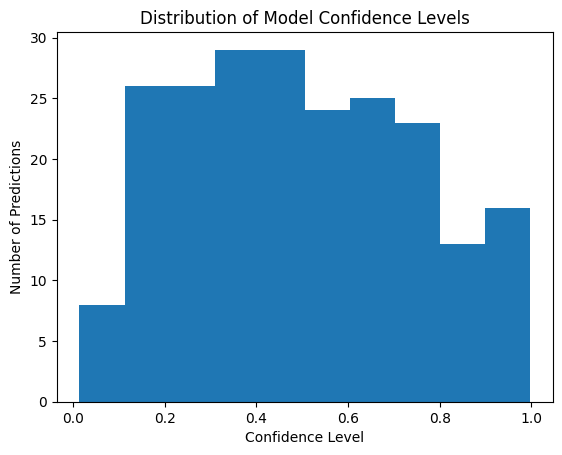

In [ ]:
preds = best_model.predict(x_test)
true_labels = y_test_cat.argmax(axis=1)
preds_probs = preds[np.arange(preds.shape[0]), true_labels]

plt.hist(preds_probs)
plt.xlabel('Confidence Level')
plt.ylabel('Number of Predictions')
plt.title('Distribution of Model Confidence Levels');


 It can be seen that the model is not confident about its predictions since about half of them fall below 0.5.

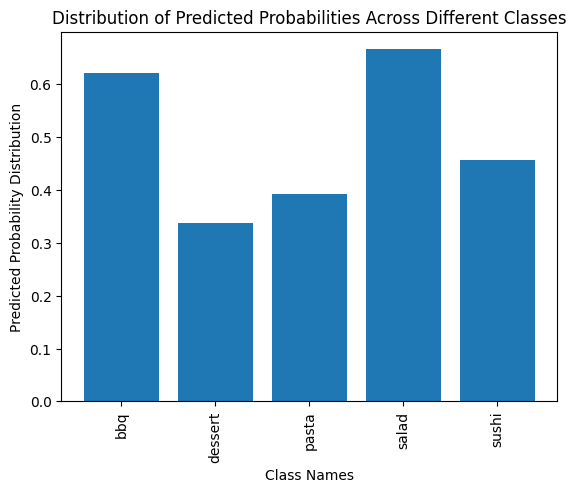

In [ ]:
# distribution of predicted probabilities across different class labels
bc = np.bincount(y_test_cat.argmax(axis=1),
                 weights = preds_probs) / np.bincount(y_test_cat.argmax(axis=1))
plt.bar(range(5), bc)
plt.xticks(range(5), categories, rotation='vertical')

plt.xlabel('Class Names')
plt.ylabel('Predicted Probability Distribution')
plt.title('Distribution of Predicted Probabilities Across Different Classes')

plt.show()

The model predicts low probabilities for all the categories, the lowest probabilities are for the categories dessert, pasta, and sushi.

In [ ]:
pred_arg = np.argmax(preds, axis=1)
y_test_arg = np.argmax(y_test_cat, axis=1)

# identifying correctly and incorrectly images
correct_indices = np.nonzero(pred_arg == y_test_arg)[0]
incorrect_indices = np.nonzero(pred_arg != y_test_arg)[0]

ci = len(correct_indices)
ii = len(incorrect_indices)
print('Correctly classified items  : {:5d} ({:=5.2f} %)'.format(ci, ci * 100 / (ci + ii)))
print('Incorrectly classified items: {:5d} ({:=5.2f} %)'.format(ii, ii * 100 / (ci + ii)))

Correctly classified items  :   150 (68.49 %)
Incorrectly classified items:    69 (31.51 %)


We created a confusion matrix to see which categories our model confuses with other categories.

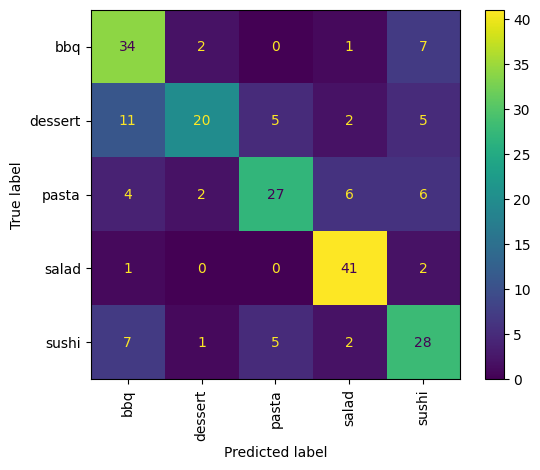

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test_arg,
                                        pred_arg,
                                        display_labels=categories,
                                        xticks_rotation = "vertical");

This confusion matrix is 5 by 5 with one row and one column for each class. The diagonal shows the accurate predictions, whereas the number of items that have been wrongly classified is shown outside of the diagonal. The model is most accurate in predicting salad, whereas dessert has the highest rate of misclassification within the model's predictions. There is a notable tendency for the model to confuse sushi with bbq, and this error occurs in both directions. The model also confuses desserts with bbq. To gain insight, we visualized examples from our dataset that the model predicted incorrectly.

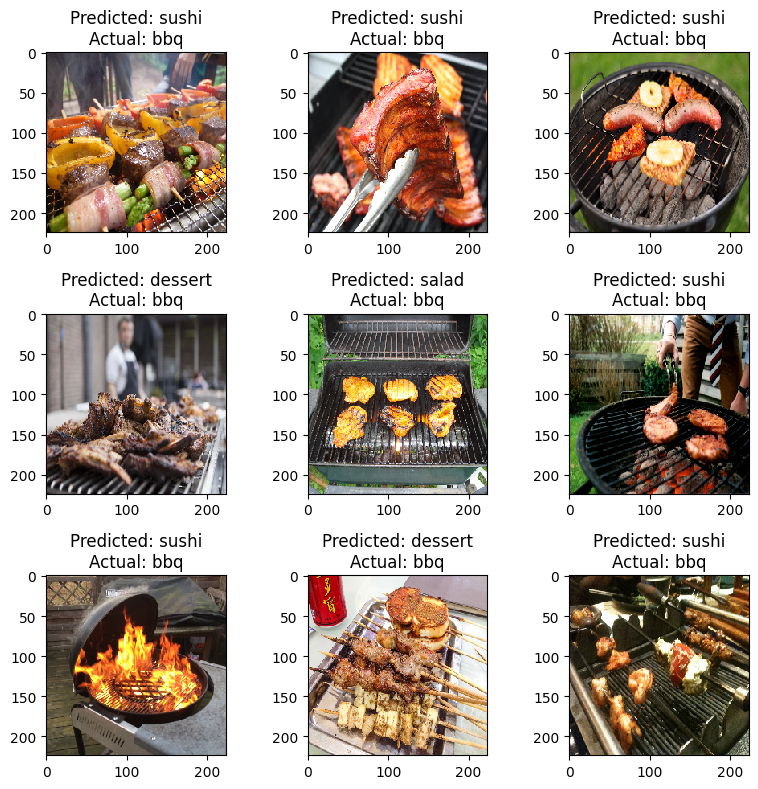

In [ ]:
# plot examples for incorrectly identified images
plt.figure(figsize=(8,8))
for i, incorrect in enumerate(incorrect_indices[:9]):
    plt.subplot(3,3,i+1)
    plt.imshow(x_test[incorrect].reshape(224, 224, 3), cmap='gray', interpolation='none')

    predicted_label = categories[pred_arg[incorrect]]
    actual_label = categories[y_test_arg[incorrect]]
    plt.title(f"Predicted: {predicted_label}\nActual: {actual_label}")

plt.tight_layout()


Upon closer inspection, we can see the rationale behind the model's misclassifications. For example, in the first row, the bbq is mistaken for sushi, possibly due to the meat pieces' size and shape resembling sushi. Sushi has also often red fish meat on top of it, adding to the confusion of the model because bbq images also has red meat pieces in it.

# Data augmentation

## Training data augmentation

The main goal of training data augmentation is to produce a training dataset that is more varied and robust. The idea is that by training on these altered images, the model learns to recognize patterns more robustly, regardless of how they are presented. Normally it is done when a more varied and messy test dataset is expected. Here, we did it more in terms of practising.

We augmented and plotted our train images.

In [ ]:
# a sequential augmentation pipeline
seq = iaa.Sequential([
    iaa.Affine(rotate=(180)),
    iaa.Crop(percent=(0, 0.4))
], random_order=True)

x_train_aug = np.array([seq.augment_image(image) for image in x_train])

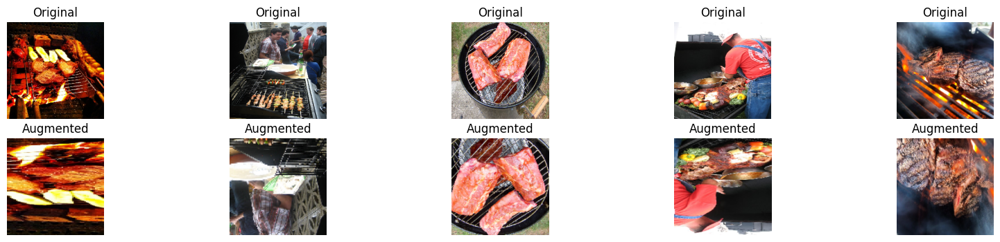

In [ ]:
def plot_images(original_images, augmented_images, num_images=10):
    plt.figure(figsize=(20, 4))
    for i in range(num_images):

        # Original Image
        ax = plt.subplot(2, num_images, i + 1)
        plt.imshow(original_images[i])
        plt.title("Original")
        plt.axis("off")

        # Augmented Image
        ax = plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(augmented_images[i])
        plt.title("Augmented")
        plt.axis("off")
    plt.show()

plot_images(x_train, x_train_aug, num_images=5)

After augmentation, we combined our transformed train and original images and trained a model using mixed data.

In [ ]:
x_train_comb = np.concatenate([x_train, x_train_aug])
y_train_cat_comb = np.concatenate([y_train_cat, y_train_cat])

We loaded a new model 'best_model_aug', so our 'best_model' will not be affected.

In [ ]:
best_model_aug = keras.models.load_model('/content/best_model.keras')

In [ ]:
history_aug = best_model_aug.fit(
    x_train_comb,
    y_train_cat_comb,
    batch_size=10,
    epochs=30,
    verbose=0,
    validation_data=(x_valid, y_valid_cat),
    callbacks=[early_stopping_monitor])

In [ ]:
def plot_training_history(history):
    df = pd.DataFrame(history.history)
    fig = make_subplots(rows=1,
                        cols=2,
                        subplot_titles=("Accuracy", "Loss"),
                        x_title="Epoch")

    # Accuracy plot
    fig.add_trace(
        go.Scatter(y=df['accuracy'],
                   line={"color": "#1f77b4"},
                   name="Train Accuracy",
                   legendgroup="1"),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(y=df['val_accuracy'],
                   line={"color": "#ff7f0e"},
                   name="Validation Accuracy",
                   legendgroup="2"),
        row=1, col=1
    )

    # Loss lot
    fig.add_trace(
        go.Scatter(y=df['loss'],
                   line={"color": "#1f77b4"},
                   name="Train Loss",
                   showlegend=False,
                   legendgroup="1"),
        row=1, col=2
    )
    fig.add_trace(
        go.Scatter(y=df['val_loss'],
                   line={"color": "#ff7f0e"},
                   name="Validation Loss",
                   showlegend=False,
                   legendgroup="2"),
        row=1, col=2
    )

    fig.update_yaxes(title_text="Accuracy", row=1, col=1)
    fig.update_yaxes(title_text="Loss", row=1, col=2)

    fig.update_layout(
        autosize=False,
        width=1500,
        height=500,
        template="seaborn",
    )

    fig.show()

In [ ]:
plot_training_history(history_aug)

In [ ]:
score_train_aug = best_model_aug.evaluate(x_train_comb, y_train_cat_comb, verbose=0)
score_valid = best_model_aug.evaluate(x_valid, y_valid_cat, verbose=0)
score_test =  best_model_aug.evaluate(x_test, y_test_cat, verbose=0)

print("Train loss of the model (including augmented data):           {:7.2f}".format(score_train_aug[0]))
print("Train accuracy of the final model (including augmented data): {:7.2f}".format(score_train_aug[1]))
print("Validation loss of the final model:                           {:7.2f}".format(score_valid[0]))
print("Validation accuracy of the final model:                       {:7.2f}".format(score_valid[1]))
print("Test loss of the final model:                                 {:7.2f}".format(score_test[0]))
print("Test accuracy of the final model:                             {:7.2f}".format(score_test[1]))

Train loss of the model (including augmented data):              0.77
Train accuracy of the final model (including augmented data):    0.84
Validation loss of the final model:                              0.89
Validation accuracy of the final model:                          0.75
Test loss of the final model:                                    1.03
Test accuracy of the final model:                                0.72


After adding data augmentation, we see no improvement in our model's performance on a validation and test sets as they do not contain pictures with any transformations. We see that performance on train data improved probably because of expanded the amount and diversity of the images.

## Testing data augmentation
The main idea behind testing data augmentation is to check out model's robustness to image transformations.

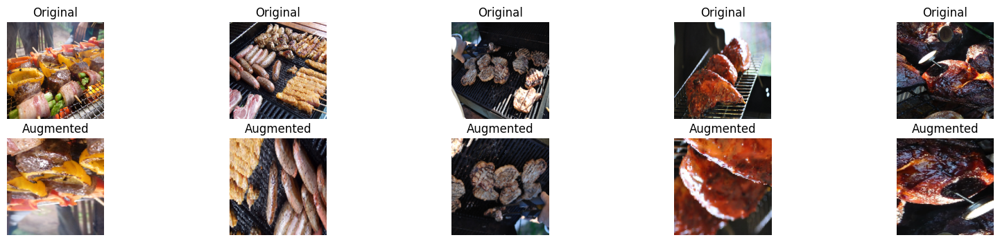

In [ ]:
x_test_aug = np.array([seq.augment_image(image) for image in x_test])

plot_images(x_test, x_test_aug, num_images=5)

In [ ]:
score_test_aug = best_model.evaluate(x_test_aug, y_test_cat, verbose=0)

print("Test loss of the model:         {:7.2f}".format(score_test_aug[0]))
print("Test accuracy of the model:     {:7.2f}".format(score_test_aug[1]))

Test loss of the model:            1.18
Test accuracy of the model:        0.60


The model's slight performance decrease on augmented test images is because it was not trained on such variations. However, it could still manage these changes, as CNNs built to identify complex patterns and adjust to shifts in object placement.

# Interpretability tecnhiques

To get more insight into how our final model works, several techniques were used.

## Maximally activating images

This technique delivers the images for what a filter from a layer from the model had the highest amount of activation for. Higher activations indicate that the filter is able to identify meaningful features and patterns within the images.

In [ ]:
def get_layer_output(model, layer_name):
    return Model(model.inputs,
                 model.get_layer(layer_name).output)

In [ ]:
def get_excitement(images, model, layer_name, filter_idx, batch_size=128):
    excitements = np.array([])
    get_activations = get_layer_output(model, layer_name)
    for i in range(0, len(images), batch_size):
        activations = get_activations(images[i : i + batch_size]) [:, :, :, filter_idx] # try to scale the excitements
        excitements = np.hstack([excitements, np.mean(np.abs(activations), axis=(1, 2))])
    return excitements

In [ ]:
def get_top_exciting_instances(images, model,
                               layer_name, filter_idx, top=4):
    excitements = get_excitement(images, model,
                                 layer_name, filter_idx)
    excitements_idx = np.argsort(excitements)[-top:][::-1]
    return excitements_idx, excitements[excitements_idx]

In [ ]:
def show_exciting_images(images, model, layer_name, filter_idx, top=4):
    excitements_idx, excitements = get_top_exciting_instances(images, model, layer_name, filter_idx, top)
    rows_cols = int(np.ceil(np.sqrt(top)))
    fig, ax = plt.subplots(rows_cols, rows_cols, figsize=(2 * rows_cols, 2 * rows_cols))
    for i, excitement_idx in enumerate(excitements_idx):
        ax[i // rows_cols][i % rows_cols].imshow(images[excitement_idx])
    fig.tight_layout()
    plt.show()

In [ ]:
# getting all convolutional layers
conv_layers = [layer.name for layer in best_model.layers if layer.name.startswith("conv2d")]
conv_layers

['conv2d', 'conv2d_1', 'conv2d_2']

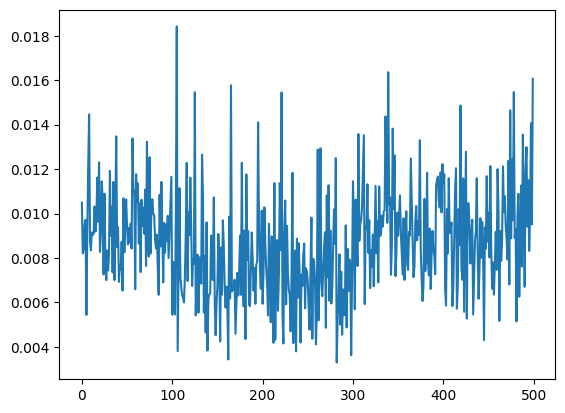

In [ ]:
plt.plot(get_excitement(x_train, best_model, conv_layers[0], 3))

The values for exitement of the filter 3 is low in the first convolutional layer, indicating weak responses to the input images and not really detecting meaningfull features and patterns.

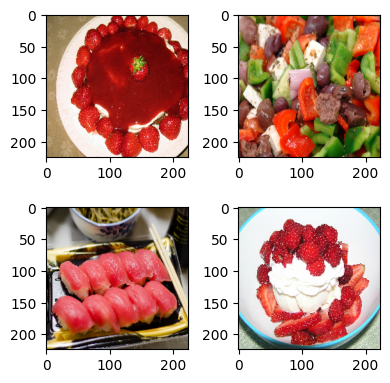

In [ ]:
show_exciting_images(x_train, best_model, conv_layers[0], filter_idx=3)

It seems that the selected filter in the first convolutional layer in our CNN model is the most excited about red patches in images.

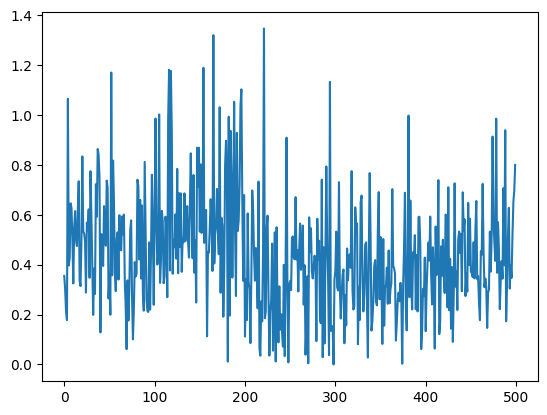

In [ ]:
plt.plot(get_excitement(x_train, best_model, conv_layers[1], 3))

The values for the selected filter in the second convolutional layer is much higher. This filter is detecting features in the input images.

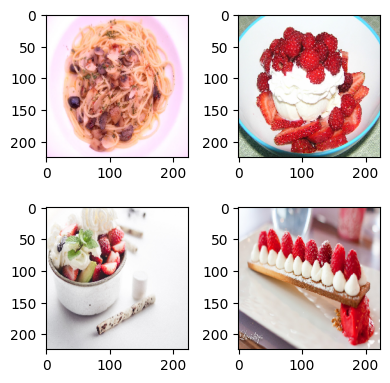

In [ ]:
show_exciting_images(x_train, best_model, conv_layers[1], filter_idx=3)

The filter indeed seems to catch on the fact that some images contain a white background.

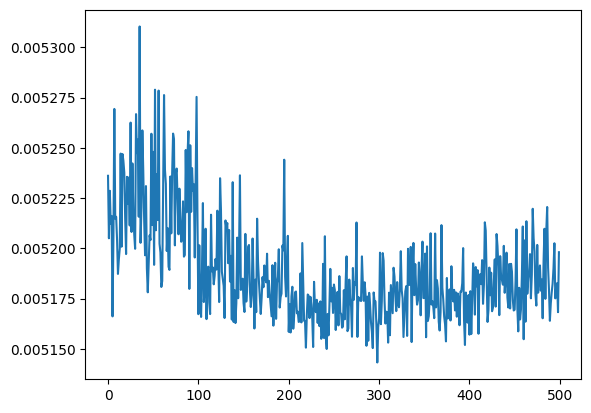

In [ ]:
plt.plot(get_excitement(x_train, best_model, conv_layers[2], 3))

The excitement values for this filter in the third convolutional layer are very low.

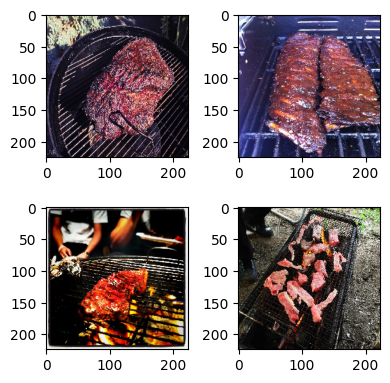

In [ ]:
show_exciting_images(x_train, best_model, conv_layers[2], filter_idx=3)

The filter seems to be excited about images containing red meat parts in the center and a dark background such as a grill.

## Deconvolution

In [ ]:
def create_deconvolution_model(model, layer_name, filter_idx):

    conv_layers = [
        layer.name
        for layer in model.layers if layer.name.startswith("conv")
    ]
    layer_idx = conv_layers.index(layer_name)

    # Create deconvolution model
    deconv_model = Sequential()
    deconv_model.add(
        Input(model.get_layer(conv_layers[0]).output.shape[1:3] + (1,))
    )

    # Add deconvolution layers starting from the layer of interest
    for idx in range(layer_idx, 0, -1):
        prev = model.get_layer(conv_layers[idx - 1])

        deconv_model.add(
            Conv2DTranspose(
              prev.filters,
              kernel_size=prev.kernel_size,
              padding="same",
              activation="gelu",
              use_bias=False
          )
        )

    # Add final deconvoution layer to output an image with three color channels
    deconv_model.add(
        Conv2DTranspose(
          3,
          kernel_size=model.get_layer(conv_layers[0]).kernel_size,
          padding="same",
          activation="gelu",
          use_bias=False
      )
    )

    # Set weights of the deconvolution layers equal to their corresponding
    # convolutional layers
    for idx, lyr in enumerate(deconv_model.layers):

        original = model.get_layer(conv_layers[layer_idx - idx])
        orig_weights = original.get_weights()[0]

        if idx == 0:
            orig_weights = orig_weights[..., filter_idx, None]

        lyr.set_weights([orig_weights])

    return deconv_model

In [ ]:
filter_idx = 3
layer_name = conv_layers[1]

deconv_model = create_deconvolution_model(best_model, layer_name, filter_idx)

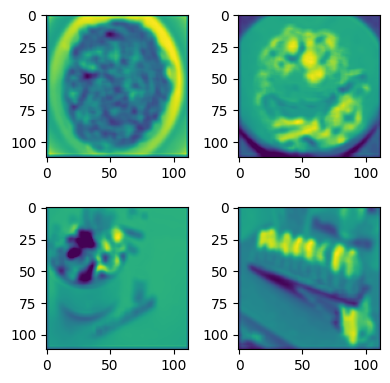

In [ ]:
excitements_idx, excitements = get_top_exciting_instances(
    x_train,
    best_model,
    layer_name,
    filter_idx
)
get_activations = get_layer_output(best_model, layer_name)
activations = get_activations(x_train[excitements_idx])[:, :, :, filter_idx]

fig, ax = plt.subplots(2, 2, figsize=(4, 4))

for act in range(len(activations)):
    ax[act // 2][act % 2].imshow(activations[act])

fig.tight_layout()

Visualizing the activations of the maximally exciting images provide more insight into where the filter of interest is exactly looking at. Here, the brightest spots are present on red places in the images and is not looking at the white background in the images.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


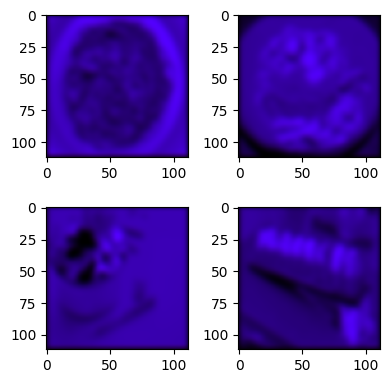

In [ ]:
deconv_imgs = deconv_model.predict(np.expand_dims(activations, axis=3))

fig, ax = plt.subplots(2, 2, figsize=(4, 4))

for act in range(len(activations)):
    ax[act // 2][act % 2].imshow(deconv_imgs[act] / np.max(deconv_imgs[act]))

fig.tight_layout()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


<ipython-input-36-cc770dc3989a>:9: RuntimeWarning: invalid value encountered in divide
  deconv_imgs[act][:, :, i] /= np.max(deconv_imgs[act][:, :, i])


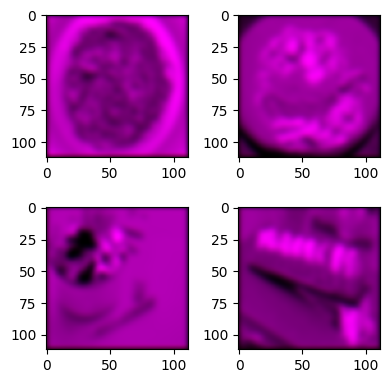

In [ ]:
deconv_imgs = deconv_model.predict(np.expand_dims(activations, axis=3))

fig, ax = plt.subplots(2, 2, figsize=(4, 4))

for act in range(len(activations)):

    # Normalize to get values between 0 and 1
    for i in range(3):
      deconv_imgs[act][:, :, i] /= np.max(deconv_imgs[act][:, :, i])

    ax[act // 2][act % 2].imshow(deconv_imgs[act])

fig.tight_layout()

An input image that results in maximum activation of a specific filter in a layer of interest can be generated be deconvulating the activations of the  maximaly exciting images of that filter. However, for the current model of interest, no new insights were obtained using this method.

## Image occlusion

The effect of the occlusion is investigated in this part. First, we defined methods to occlude images and plotted an example of the original (on the left) and the occluded (on the right) images.

In [ ]:
def occlude_image(img, pos=(0, 0), occlusion_size=150, color=(0.5, 0.5, 0.5), occlusion_value=0):
    img = img.copy()
    img[pos[0] : pos[0] + occlusion_size, pos[1] : pos[1] + occlusion_size, :] = color
    return img

In [ ]:
def generate_occluded_images(img, occlusion_size=150, **kwargs):
    images = []
    for y in range(0, img.shape[0] - occlusion_size + 1):
        for x in range(0, img.shape[1] - occlusion_size + 1):
            images.append(occlude_image(img, pos=(y, x), **kwargs))
    return np.array(images)

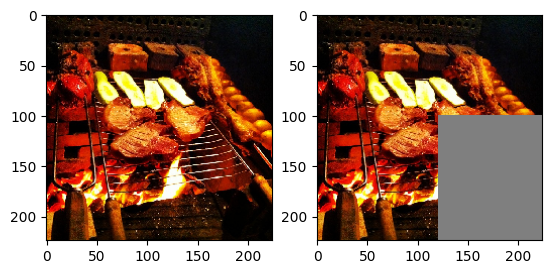

In [ ]:
test_instance = x_train[0]
plt.subplot(1, 2, 1)
plt.imshow(test_instance)

plt.subplot(1, 2, 2)
plt.imshow(occlude_image(test_instance, pos=(100, 120)))

plt.show()

Then, we generated more occluded images. As images size was big and computatinal resourses are limited, the occlusion size was choosen quite big. We understand that normally it is better to choose smaller size of occlusion than we have here.

In [ ]:
occluded_images = generate_occluded_images(test_instance)

In [ ]:
occluded_images.shape

(5625, 224, 224, 3)

In [ ]:
original_pred = best_model.predict(np.array([test_instance]))[0]
original_prob = original_pred[np.argmax(original_pred)]
original_pred, np.argmax(original_pred), original_prob

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


(array([0.87400645, 0.07425888, 0.00678064, 0.00565405, 0.03929994],
       dtype=float32),
 0,
 0.87400645)

In [ ]:
predictions = best_model.predict(occluded_images)

176/176 ━━━━━━━━━━━━━━━━━━━━ 24s 140ms/step


In [ ]:
predictions.shape

(5625, 5)

On the plot we see the confidence of the model. We see that the model is confident in case of original images. As for occluded images, the model's confidence varies as different areas of the image are obscured, as indicated by the blue line.

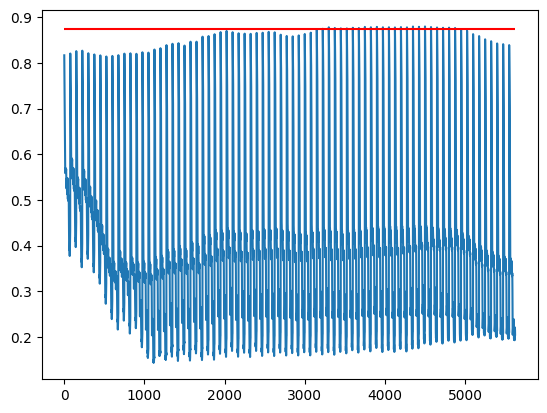

In [ ]:
plt.plot(predictions[:, np.argmax(original_pred)])
plt.hlines(original_prob, xmin=0, xmax=len(predictions), colors="r")

We created a heatmap to see which areas are more critical for the model's performance. Red-highlighted areas are important for this classification task if model's performance significantly depends on them. For instance, here the model might be concentrating on the texture or grill marks in an image of grilled food in order to set it out from other foods or backgrounds.

In [ ]:
occlusion_size = 150
heatmap = np.zeros(test_instance.shape)

pred_idx = 0
for y in range(0, heatmap.shape[0] - occlusion_size + 1):
    for x in range(0, heatmap.shape[1] - occlusion_size + 1):
        prob = predictions[pred_idx, np.argmax(original_pred)]
        heatmap[y : y + occlusion_size, x : x + occlusion_size, :] += (max(0, original_prob - prob), 0, 0)
        pred_idx += 1

heatmap[:, :, 0] = minmax_scale(heatmap[:, :, 0])

In [ ]:
assert pred_idx == len(occluded_images)

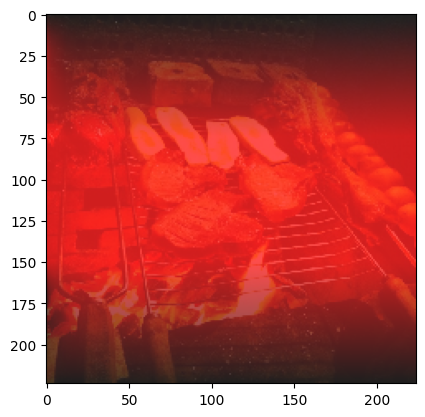

In [ ]:
plt.imshow(test_instance, alpha=0.6)
plt.imshow(heatmap, alpha=0.7)

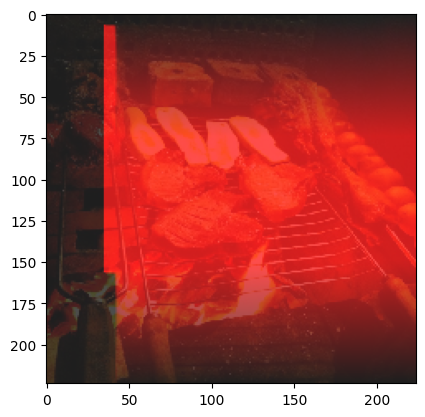

In [ ]:
heatmap = np.zeros(test_instance.shape)

pred_idx = 0
for y in range(0, heatmap.shape[0] - occlusion_size + 1):
    for x in range(0, heatmap.shape[1] - occlusion_size + 1):
        probs = predictions[pred_idx, :]
        if np.argmax(probs) != np.argmax(original_pred):
            heatmap[y : y + occlusion_size, x : x + occlusion_size, :] += (1, 0, 0)
        pred_idx += 1

heatmap[:, :, 0] = minmax_scale(heatmap[:, :, 0])

plt.imshow(test_instance, alpha=0.6)
plt.imshow(heatmap, alpha=0.7)

## Dimensionality reduction with t-SNE

Next, we ran t-SNE on raw input images (on the right) and compared with t-SNE of the dense layer (on the left).

t-SNE is unsupervised when applied to the raw images and it groups them based on visible features like color and brightness without knowing the labels, which can scatter similar images if they vary in tone. In contrast, a neural network, which is trained with labels, focuses on more important features for classification, such as textures and shapes, effectively distinguishing between different classes beyond just color or brightness.

In [ ]:
def get_layer_output(model, layer_name):
    return Model(inputs=model.inputs, outputs=[model.get_layer(layer_name).output])

In [ ]:
tsne = TSNE(init="pca", learning_rate=120)

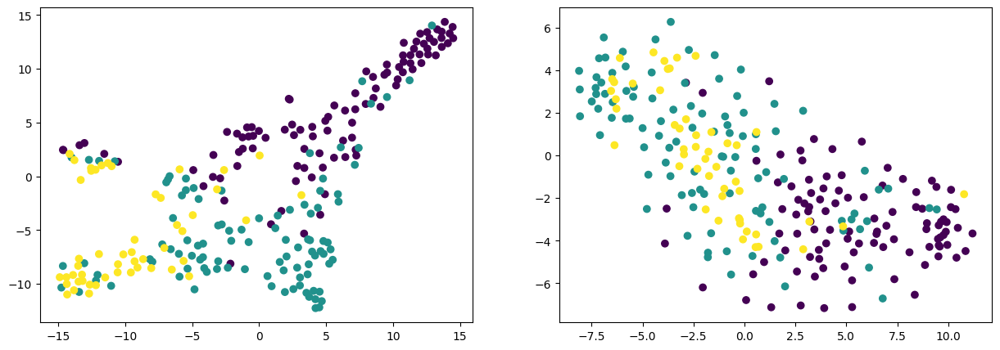

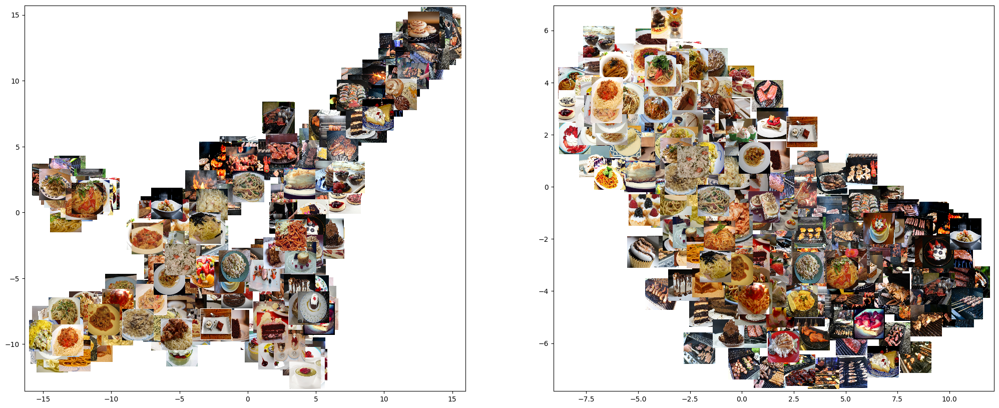

In [ ]:
num_images = 250
get_activations = get_layer_output(best_model, "dense")
activations = get_activations(x_train[:num_images])

transformed_dense = tsne.fit_transform(activations)
transformed_input = tsne.fit_transform(
    x_train[:num_images].reshape((num_images, x_train.shape[1] * x_train.shape[2] * x_train.shape[3]))
)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].scatter(transformed_dense[:, 0], transformed_dense[:, 1], c=np.where(1 == y_train_cat[:num_images])[1])
ax[1].scatter(transformed_input[:, 0], transformed_input[:, 1], c=np.where(1 == y_train_cat[:num_images])[1])
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(25, 10))
ax[0].scatter(transformed_dense[:, 0], transformed_dense[:, 1], c=np.where(1 == y_train_cat[:num_images])[1])
ax[1].scatter(transformed_input[:, 0], transformed_input[:, 1], c=np.where(1 == y_train_cat[:num_images])[1])
for i, t in enumerate(transformed_dense):
    ab = AnnotationBbox(OffsetImage(x_train[i], zoom=0.2), (t[0], t[1]), frameon=False)
    ax[0].add_artist(ab)
for i, t in enumerate(transformed_input):
    ab = AnnotationBbox(OffsetImage(x_train[i], zoom=0.2), (t[0], t[1]), frameon=False)
    ax[1].add_artist(ab)
plt.show()

# Transfer learning

A faster and sometimes more accuratly model can be derived with pretrained models, such as ResNet50 and VGG16. These models can be (partially) loaded,  additional layers can be put on top of it, and you can train this 'new' model. We will try these two mentioned pretrained models.

## ResNet50


In [ ]:
# loading the data in a way which ResNet50 can handle
x_train_rn, y_train_rn = preprocess_images(os.path.join(split_dir, "train"),
                                     classes=categories,
                                     preprocessor=resnet50.preprocess_input,
                                     samples = 100, target_size=(224, 224))
x_valid_rn, y_valid_rn = preprocess_images(os.path.join(split_dir, "validation"),
                                     classes=categories,
                                    preprocessor=resnet50.preprocess_input,
                                     samples = 100,
                                     target_size=(224, 224))
x_test_rn, y_test_rn = preprocess_images(os.path.join(split_dir, "test"),
                                    classes=categories,
                                    preprocessor=resnet50.preprocess_input,
                                    samples = 100,
                                    target_size=(224, 224))

/content/images/split/train/bbq: 100 / 200
/content/images/split/train/dessert: 100 / 199
/content/images/split/train/pasta: 100 / 207
/content/images/split/train/salad: 100 / 205
/content/images/split/train/sushi: 100 / 197
/content/images/split/validation/bbq: 42 / 43
/content/images/split/validation/dessert: 42 / 43
/content/images/split/validation/pasta: 43 / 44

/content/images/split/validation/sushi: 41 / 42
/content/images/split/test/bbq: 43 / 44
/content/images/split/test/dessert: 42 / 43
/content/images/split/test/pasta: 44 / 45
/content/images/split/test/salad: 43 / 44
/content/images/split/test/sushi: 42 / 43


In [ ]:
y_train_rn_cat = to_categorical(y_train_rn)
y_valid_rn_cat = to_categorical(y_valid_rn)
y_test_rn_cat = to_categorical(y_test_rn)

### Using pretrained model predictions

The ResNet50 pretrained model consists of 1000 classes, while we only have 5 classes. We will first looked into how the pretrained model performed without changing anything about it.

In [ ]:
# load fully pre-trained ResNet50 model
rn_model = resnet50.ResNet50(weights="imagenet", include_top=True)

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
rn_model_train = rn_model.predict(x_train_rn, batch_size=2)

250/250 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step


In [ ]:
rn_model_valid = rn_model.predict(x_valid_rn, batch_size=2)

108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


(0.8055555555555556, 0.9305555555555556, 0.9583333333333334)

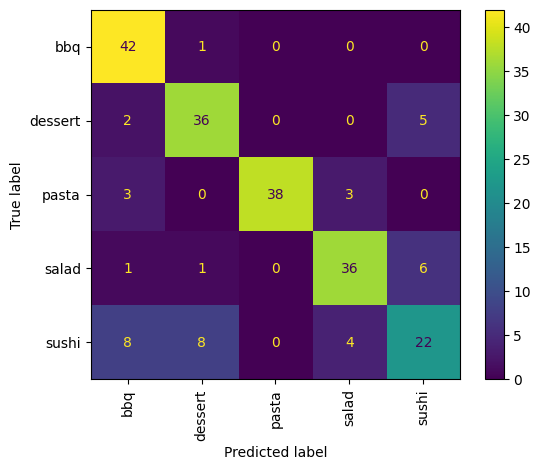

In [ ]:
# confusion matrix for the validation set
y_pred_rn = KNeighborsClassifier(metric="cosine").fit(rn_model_train, y_train_rn_cat).predict(rn_model_valid)
y_pred_rn_c = np.argmax(y_pred_rn, axis=1)
ConfusionMatrixDisplay.from_predictions(y_valid_rn, y_pred_rn_c, display_labels=categories, xticks_rotation = "vertical")

accuracy_score(y_valid_rn, y_pred_rn_c), top_k_accuracy_score(y_valid_rn, y_pred_rn, k=2), top_k_accuracy_score(y_valid_rn, y_pred_rn, k=3)

Utilizing the fully pretrained ResNet50 model yields accuracy scores of 0.81  validation dataset. This performance surpasses that of our 'basic' CNN model, owing to ResNet50's deeper architecture and extensive pretraining. However, the model encounters challenges; the category sushi was often mislabed and also salad and dessert were sometimes predicted as sushi. Possible explanations include the absence of a specific sushi class in the ResNet50 dataset or the lack of a closely related class for sushi recognition.

###  Adding layers on top and finetuning

We wanted to see whether ResNet50, originally trained on ImageNet for classifying images into 1000 categories, performs better after adapting it for a new task of classifying images into 5 classes. This adaptation involved freezing the pre-trained layers to keep learned features, replacing the top layer with a global average pooling layer followed by a dense layer for 5-class classification.

In [ ]:
# load pre-trained ResNet50 model (without top fully connected layers)
base_rn_model = resnet50.ResNet50(weights='imagenet', include_top=False,
                                        input_shape = (224, 224, 3))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
#  let the layers of resnet50 not be trainable
for layer in base_rn_model.layers:
    layer.trainable = False

In [ ]:
# adding on top of the base transfer model
x = base_rn_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(5, activation='softmax')(x)

In [ ]:
fullmodel = Model(inputs=base_rn_model.input, outputs=predictions)

In [ ]:
# compile the model
fullmodel.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
fullmodel.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,597,957 (90.02 MB)

 Trainable params: 10,245 (40.02 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
history_fullmodel = fullmodel.fit(x_train_rn,
                                  y_train_rn_cat,
                                  batch_size=16,
                                  epochs=20,
                                  verbose=0,
                                  validation_data=(x_valid_rn, y_valid_rn_cat))

In [ ]:
plot_training_history(history_fullmodel)

The training dataset reaches after 4 training epochs already an accuracy of 1, which can be due to deep vastness of ResNet50 (with it many parameters with 10,245 trainable parameters and 23,587,712 non-trainable parameters) and only our small training dataset (500 images).

In [ ]:
fullmodel_train = fullmodel.predict(x_train_rn, batch_size = 2)

250/250 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step


In [ ]:
fullmodel_valid = fullmodel.predict(x_valid_rn, batch_size = 2)

108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


(0.9490740740740741, 0.9629629629629629, 0.9629629629629629)

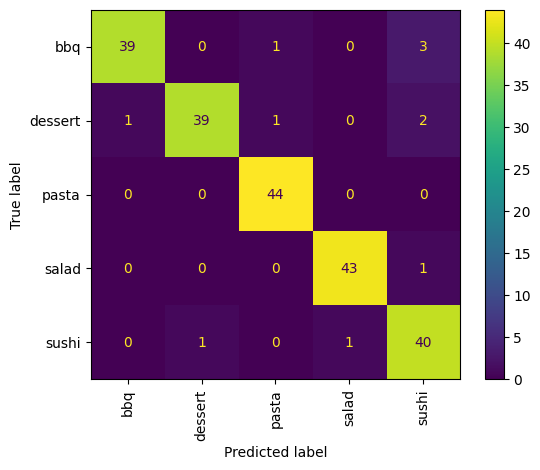

In [ ]:
# confusion matrix for validation set
y_pred_transfer = KNeighborsClassifier(metric="cosine").fit(fullmodel_train, y_train_rn_cat).predict(fullmodel_valid)
y_pred_transfer_c = np.argmax(y_pred_transfer, axis=1)
ConfusionMatrixDisplay.from_predictions(y_valid_rn,
                                        y_pred_transfer_c,
                                        display_labels=categories,
                                        xticks_rotation = "vertical")

accuracy_score(y_valid_rn, y_pred_transfer_c), top_k_accuracy_score(y_valid_rn, y_pred_transfer, k=2), top_k_accuracy_score(y_valid_rn, y_pred_transfer, k=3)

Since we had concerns about the correctness of our labels we also looked into this with this ResNet50 model:

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step


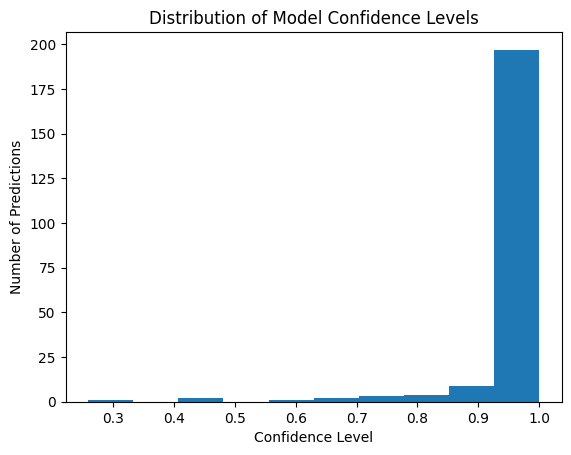

In [ ]:
# distribution of the confidence level for predictions
preds = fullmodel.predict(x_test_rn)
true_labels = y_test_rn_cat.argmax(axis=1)
preds_probs = preds[np.arange(preds.shape[0]), true_labels]

plt.hist(preds_probs)
plt.xlabel('Confidence Level')
plt.ylabel('Number of Predictions')
plt.title('Distribution of Model Confidence Levels');

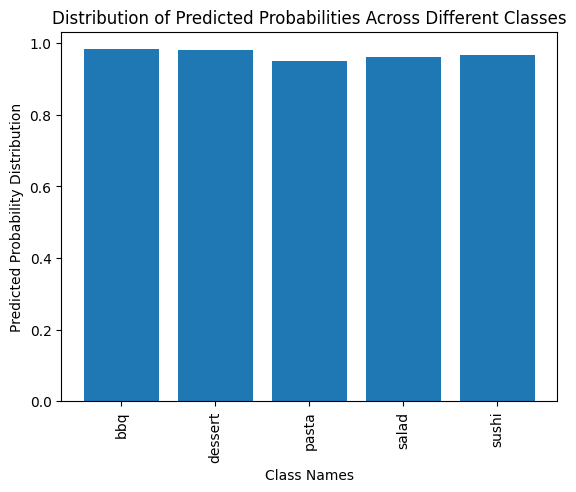

In [ ]:
# distribution of predicted probabilities across different class labels
bc = np.bincount(y_test_rn_cat.argmax(axis=1),
                 weights = preds_probs) / np.bincount(y_test_rn_cat.argmax(axis=1))
plt.bar(range(5), bc)
plt.xticks(range(5), categories, rotation='vertical')

plt.xlabel('Class Names')
plt.ylabel('Predicted Probability Distribution')
plt.title('Distribution of Predicted Probabilities Across Different Classes')

plt.show()

The validation accuracy reaches 0.98 when converting ResNet50 to only 5 classes instead of 1,000. The confusion matrix now indicates that there is no longer a difficulty with the category sushi. The additionally plots of the distributions of the model's confidence level and predicted probabilities indicate that there is no mislabeling and that the model is fairly confident in it's predictions (as opposed to our obtained CNN model).

## VGG16

VGG16 is a model with 16 layers with also 1000 classes. We followed the same approach as with ResNet50.

In [ ]:
# loading the data in a way which vgg16 can handle
x_train_vgg, y_train_vgg = preprocess_images(os.path.join(split_dir, "train"),
                                     classes=categories,
                                     preprocessor=vgg16.preprocess_input,
                                     samples = 100,
                                     target_size=(224, 224))
x_valid_vgg, y_valid_vgg = preprocess_images(os.path.join(split_dir, "validation"),
                                     classes=categories,
                                     preprocessor=vgg16.preprocess_input,
                                     samples = 100,
                                     target_size=(224, 224))
x_test_vgg, y_test_vgg = preprocess_images(os.path.join(split_dir, "test"),
                                     classes=categories,
                                     preprocessor=vgg16.preprocess_input,
                                     samples = 100,
                                     target_size=(224, 224))

/content/images/split/train/bbq: 100 / 200
/content/images/split/train/dessert: 100 / 199
/content/images/split/train/pasta: 100 / 207
/content/images/split/train/salad: 100 / 205
/content/images/split/train/sushi: 100 / 197
/content/images/split/validation/bbq: 42 / 43
/content/images/split/validation/dessert: 42 / 43
/content/images/split/validation/pasta: 43 / 44
/content/images/split/validation/salad: 43 / 44
/content/images/split/validation/sushi: 41 / 42
/content/images/split/test/bbq: 43 / 44
/content/images/split/test/dessert: 42 / 43
/content/images/split/test/pasta: 44 / 45
/content/images/split/test/salad: 43 / 44
/content/images/split/test/sushi: 42 / 43


In [ ]:
y_train_vgg_cat = to_categorical(y_train_vgg)
y_valid_vgg_cat = to_categorical(y_valid_vgg)
y_test_vgg_cat = to_categorical(y_test_vgg)

### Using pretrained model predictions

In [ ]:
# load fully pre-trained vgg16 model
vgg_model = vgg16.VGG16(weights="imagenet", include_top=True, input_shape = (224, 224, 3))

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 14s 0us/step


In [ ]:
vgg_model_train = vgg_model.predict(x_train_vgg, batch_size=2)

250/250 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


In [ ]:
vgg_model_valid = vgg_model.predict(x_valid_vgg, batch_size=2)

108/108 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


(0.7916666666666666, 0.8935185185185185, 0.9351851851851852)

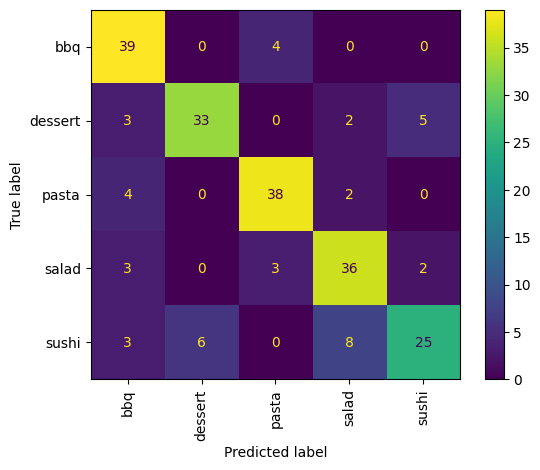

In [ ]:
# confusion matrix for the validation set
y_pred_vgg = KNeighborsClassifier(metric="cosine").fit(vgg_model_train, y_train_vgg_cat).predict(vgg_model_valid)
y_pred_vgg_c = np.argmax(y_pred_vgg, axis=1)
ConfusionMatrixDisplay.from_predictions(y_valid_vgg, y_pred_vgg_c, display_labels=categories, xticks_rotation = "vertical")

accuracy_score(y_valid_vgg, y_pred_vgg_c), top_k_accuracy_score(y_valid_vgg, y_pred_vgg, k=2), top_k_accuracy_score(y_valid_vgg, y_pred_vgg, k=3)

The validation accuracy is now 0.79 for the validation dataset. The confusion matrix again indicates that the model has the most difficulties with the sushi category. And again it is already much better than our obtained CNN model.

### Adding a layer on top and finetuning

In [ ]:
# load pre-trained VGG16 model (without top fully connected layers)
vgg_model_base = vgg16.VGG16(weights="imagenet", include_top=False,
                             input_shape = (224, 224, 3))

In [ ]:
# let the layers of vgg16 not be trainable
for layer in vgg_model_base.layers:
  layer.trainable = False

In [ ]:
# adding on top of the base transfer model
x = vgg_model_base.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(5, activation='softmax')(x)

In [ ]:
fullmodel_vgg = Model(inputs=vgg_model_base.input, outputs=predictions)

In [ ]:
# compile the model
fullmodel_vgg.compile(optimizer='adam', loss='categorical_crossentropy',
                  metrics=['accuracy'])
fullmodel_vgg.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_5           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 5)                   │           2,5

 Total params: 14,717,253 (56.14 MB)

 Trainable params: 2,565 (10.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
history_fullmodel_vgg = fullmodel_vgg.fit(x_train_vgg,
                                      y_train_vgg_cat,
                                      batch_size=16,
                                      epochs=20,
                                      verbose=0,
                                      validation_data=(x_valid_vgg, y_valid_vgg_cat))

In [ ]:
plot_training_history(history_fullmodel_vgg)

108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step


(0.9212962962962963, 0.9768518518518519, 0.9861111111111112)

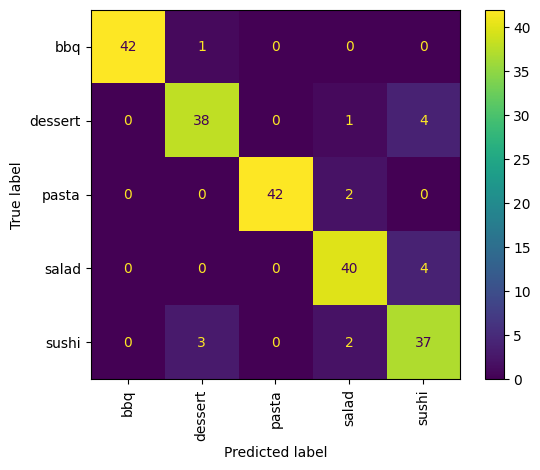

In [ ]:
# confusion matrix for the validation set
y_pred_vgg_full = fullmodel_vgg.predict(x_valid_vgg, batch_size=2)
y_pred_vgg_full_c = np.argmax(y_pred_vgg_full, axis=1)

ConfusionMatrixDisplay.from_predictions(y_valid_vgg,
                                        y_pred_vgg_full_c,
                                        display_labels=categories,
                                        xticks_rotation = "vertical")

accuracy_score(y_valid_vgg, y_pred_vgg_full_c), top_k_accuracy_score(y_valid_vgg, y_pred_vgg_full, k=2), top_k_accuracy_score(y_valid_vgg, y_pred_vgg_full, k=3)

We see that this trainable VGG16 model with only 5 classes also performs better (0.92 accuracy for the validation set). The training dataset again reaches an accuracy score of 1. It still has, however, some problems with mainly again the category sushi. The almost 0.08 difference between the accuracy for validaton and training set hints at overfitting of the data. This can sometimes be resolved with using more data since we only use a limited amount of training (500) and validation (211) data.

